# imports

In [1]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
Using TensorFlow backend.


# settings

In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap
cls_cmp = palettable.cartocolors.qualitative.Bold_10.mpl_colors

# functions

In [3]:
def get_m_from_p(a_use,pval_thre,method='pval_thre'):
#     a_use = a_m_hepa
#     pval_thre = 0.01

    rec2mat_fun = lambda rec: np.vstack([np.array(list(m)) for m in rec])
    name_mat = a_use.uns['rank_genes_groups']['names']
    pval_mat = a_use.uns['rank_genes_groups']['pvals_adj']
    score_mat = a_use.uns['rank_genes_groups']['scores']
    
    
    name_mat = rec2mat_fun(name_mat)
    pval_mat = rec2mat_fun(pval_mat)
    score_mat = rec2mat_fun(score_mat)
    n_cls = name_mat.shape[1]

    rst_list = []
    for i in range(n_cls):
        if method=='pval_thre':
            cur_idx = (pval_mat[:,i]<=pval_thre)
        elif method=='pval_topk':
            kth_p = np.sort(pval_mat[:,i])[pval_thre]
            cur_idx = (pval_mat[:,i]<=kth_p)
        elif method=='score_thre':
            cur_idx = (score_mat[:,i]>=pval_thre)
        elif method=='score_topk':
            kth_score = np.flip(np.sort(score_mat[:,i]))[pval_thre]
            cur_idx = (score_mat[:,i]>=kth_score)
            
        cur_m = name_mat[cur_idx,i]
        rst_list.append(cur_m)
        print(cur_m.shape[0])
    return rst_list



# load

### load raw and segmented data from data/process/

In [4]:
a = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_liver_revision_raw.h5ad')

IMS is the raw mass imaging data

cell_idx stores cell index for every non_background pixels

cell_pos stores pixel coordination for every non_background pixels

train_x stores metabolic profile for every non_background pixels

### display raw ion image data

256 256


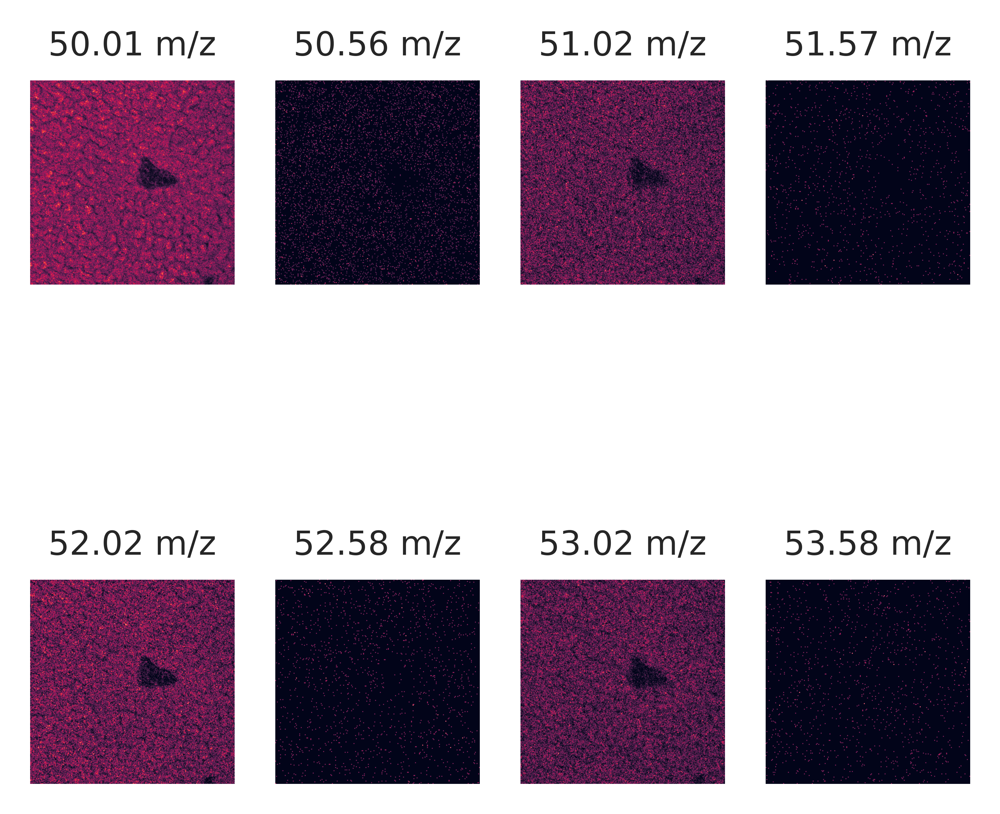

In [5]:
SEAM.pl.IMS(a,list(a.var_names[:8]),n_cols=4)

# View

### run SIMS-View with DR_method=Umap

In [6]:
a = SEAM.tl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

### show result of SIMS-View

In [7]:
SEAM.pl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 29850 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


# Cut

### get segmented mask and cell position, and write into anndata

In [6]:
a=SEAM.tl.Cut(a)

setting obsm: spatial


## each cell represented as a dot

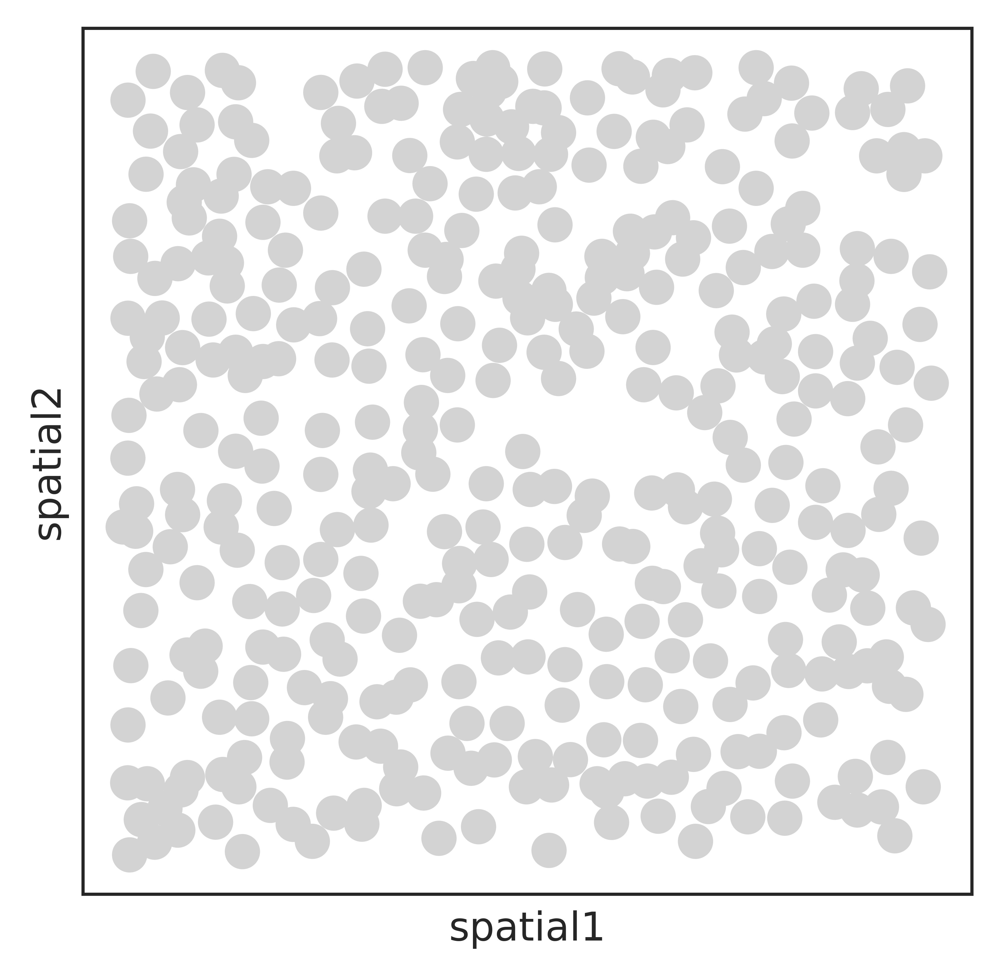

In [7]:
SEAM.pl.Cut(a,method='dot',save=None)

## each cell represented as a segmented mask

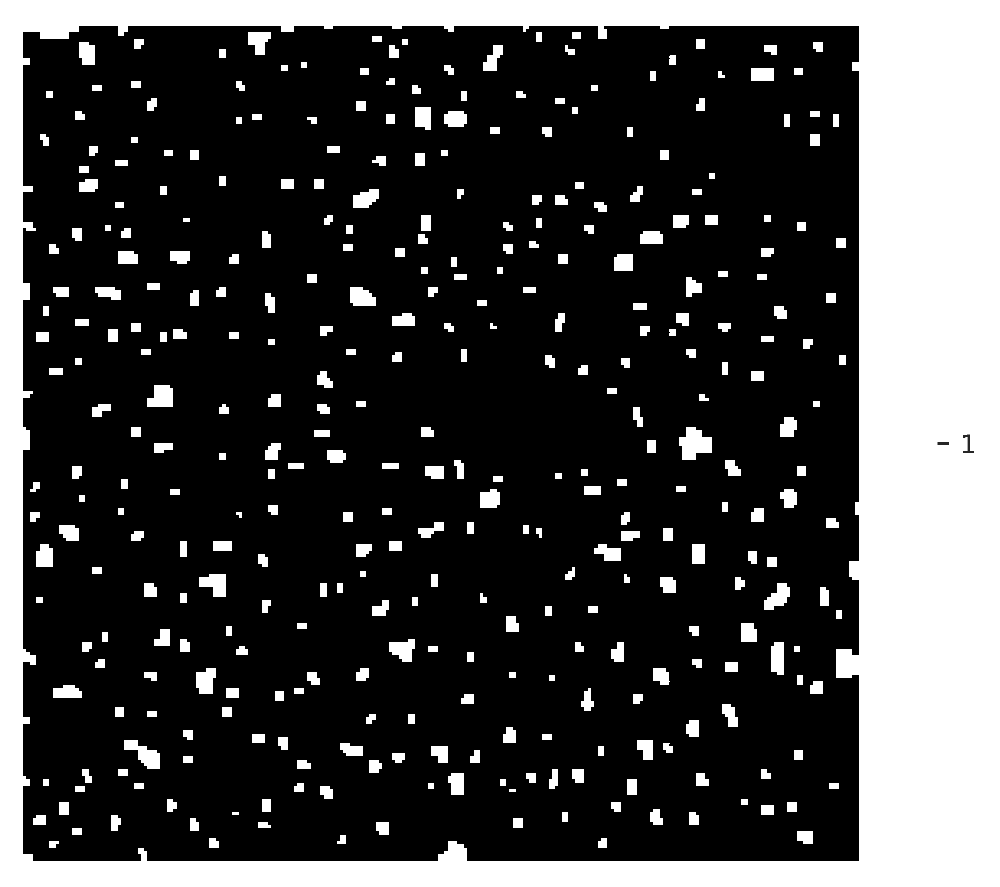

In [8]:
SEAM.pl.Cut(a,method='mask',save=None)

# ID&Cluster

### run SIMS-ID with epochs and temperature.

In [9]:
SEAM.tl.ID(a,epochs=200,t=5,subsample=False,verbose=True)

running SIMS-ID...


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/200
4237/4237 [==============================] - 1s 209us/step - loss: 5.8668 - softmax_loss: 5.8621 - center_loss: 3.0350
Epoch 2/200
4237/4237 [==============================] - 0s 86us/step - loss: 5.7116 - softmax_loss: 5.7091 - center_loss: 7.2541
Epoch 3/200
4237/4237 [==============================] - 0s 91us/step - loss: 5.6360 - softmax_loss: 5.6370 - center_loss: 6.5852
Epoch 4/200
4237/4237 [==============================] - 0s 103us/step - loss: 5.4837 - softmax_loss: 5.4838 - center_loss: 7.8480
Epoch 5/200
4237/4237 [==============================] - 0s 103us/step - loss: 5.3636 - softmax_loss: 5.3648 - center_loss: 13.1497
Epoch 6/200
4237/4237 [==============================] - 0s 86us/step - loss: 5.2673 - softmax_loss: 5.2729 - center_loss: 22.1437
Epoch 7/200
4237/4237 [==============================] - 0s 96us/step - loss: 5.2182 - softmax_loss: 5.2122 - center_loss: 26.6538
Epoch 8/200
4237/4237 [==============================] - 0s 99us/step - loss: 5.1885

### dump intermediate results

In [12]:
a.write_h5ad('../../data/demo_dump/ID.h5ad')

### run Cluster methods with cell representation method of SIMS-ID

In [10]:
a = SEAM.tl.Cluster(a,method='SIMLR',cluster_param=4,rep='ID')

(378, 4237) 4
SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:70: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:75: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 0.573798 seconds in total

done!


### umap embedding with cell representation method of SIMS-ID

In [11]:
a = SEAM.tl.Umap(a,rep='ID')

computing neighbors
    finished (0:00:01)
computing UMAP
    finished (0:00:01)
Sucessfully run Umap!


### Umap embedding colored coded by SIMLR result

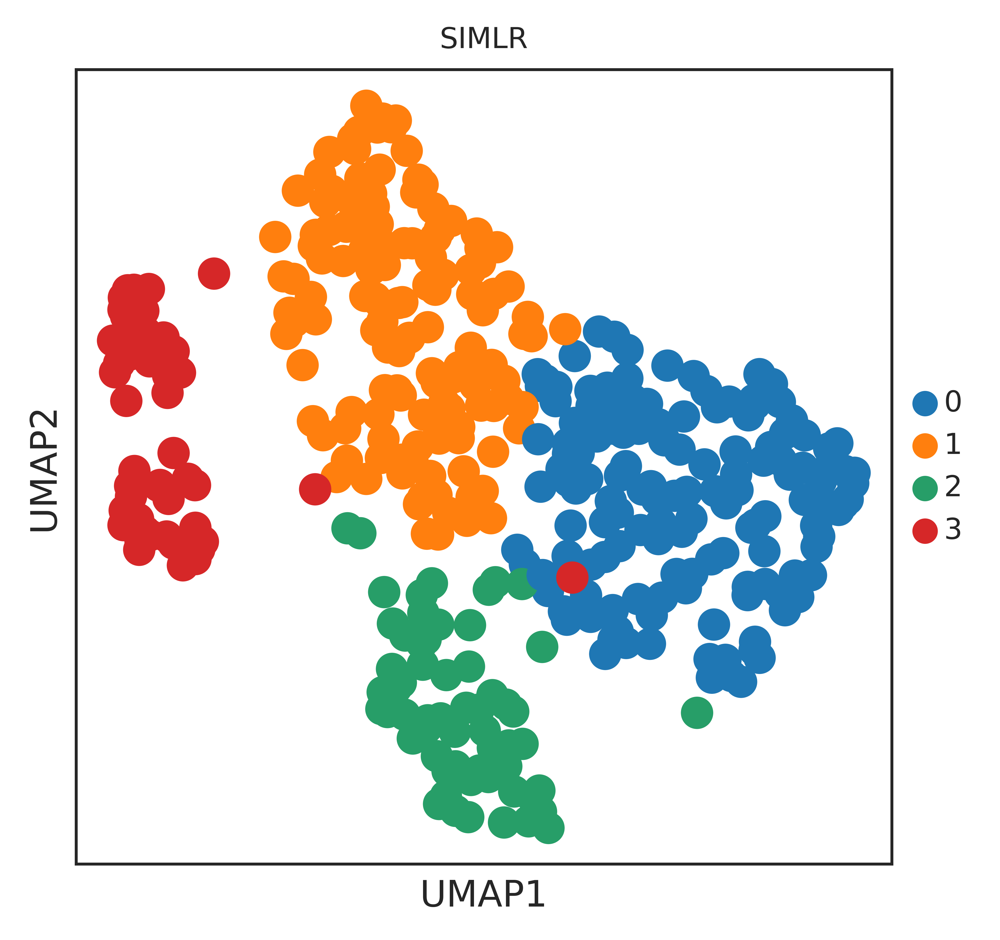

In [12]:
SEAM.pl.ID(a)

we use the SIMS-ID representation to get the Umap embedding, and a rough cluster result,

and find that  that SIMLR cluster successfully partition the cells into hepatocytes (with some heterogeneity),and non-hepatocytes (according to H&E and IHC staining).


In [23]:
sc.tl.louvain(a,restrict_to=('SIMLR',['3']),resolution=0.5,key_added='cluster')
# sc.tl.louvain(a,restrict_to=('SIMLR',['3']))

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


In [25]:
new_cluster_names = [
    '0',
    '1',
    '2',
    '3',
    '4',
#     '5'
    
]
a.rename_categories('cluster', new_cluster_names)

In [26]:
a.obs['cluster']

0      0
1      3
2      0
3      1
4      0
      ..
373    1
374    1
375    0
376    1
377    0
Name: cluster, Length: 378, dtype: category
Categories (5, object): [0, 1, 2, 3, 4]

In [28]:
cmp_use = [cls_cmp[6],cls_cmp[7],cls_cmp[4],cls_cmp[3],cls_cmp[2]]

Further using SIMS-ID representation to cluster non-hepatocytes, we get two clusters which are consistent with Kupffer cells and Endothelial cells

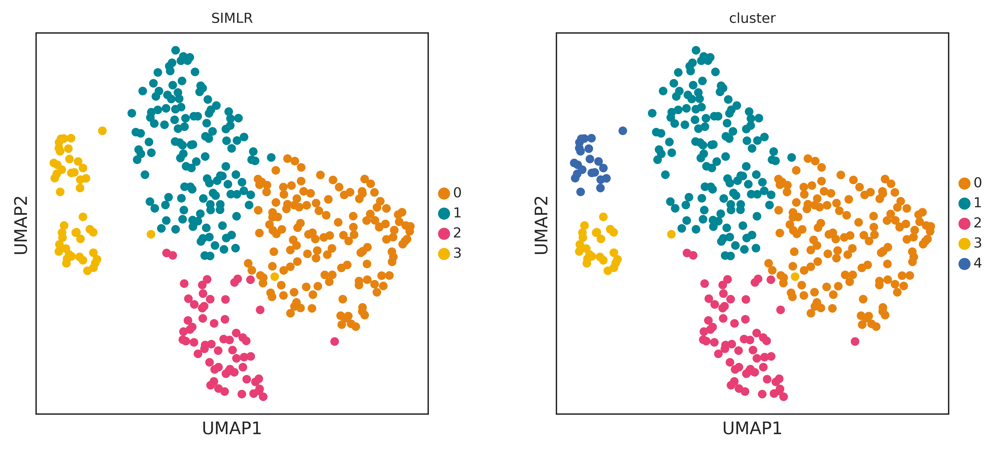

In [29]:
sc.pl.umap(a,color=['SIMLR','cluster'],s=100,palette=cmp_use)

annotate the cell type according to H&E and IHC

In [30]:
# annotation = {
#     '0':'Hepatocyte',
#     '1':'Hepatocyte',
#     '2':'Hepatocyte_CV',
#     '3':'Kupffer',
#     '5':'Endothelial',
#     '4':'Other'
# }

annotation = {
    '0':'Hepatocyte',
    '1':'Hepatocyte',
    '2':'Hepatocyte_CV',
    
    '3':'Kupffer',
    '4':'Endothelial',
#     '4':'Hepatocyte_CV',
    
# #     '5':'Other'
}
CT = np.array(a.obs['cluster'].copy())
CT = [annotation[i] for i in CT]
a.obs['CT'] = CT
a.obs['CT'] = a.obs['CT'].astype('category')

### get marker metabolites

In [31]:
sc.tl.rank_genes_groups(a,n_genes=a.shape[0],groupby='louvain_R')
a_marker = get_m_from_p(a,20,method='score_topk')


ranking genes
    finished (0:00:00)
21
21
21
21
21


In [34]:
np.array(a.var_names).astype('float')

array([ 50.01,  50.56,  51.02,  51.57,  52.02,  52.58,  53.02,  53.58,
        54.04,  55.03,  56.04,  57.02,  58.02,  59.02,  59.99,  61.  ,
        62.01,  62.97,  63.58,  64.01,  65.01,  66.01,  67.03,  68.03,
        69.01,  70.05,  71.03,  72.02,  73.03,  74.02,  75.  ,  75.98,
        76.99,  78.04,  78.96,  79.9 ,  80.99,  82.03,  83.04,  84.04,
        85.05,  86.02,  87.03,  88.02,  89.01,  90.01,  91.  ,  92.02,
        93.04,  94.03,  95.02,  96.01,  97.  ,  98.03,  99.05, 100.04,
       101.05, 101.97, 102.98, 104.01, 105.01, 106.02, 107.02, 108.04,
       109.04, 110.02, 111.04, 112.  , 113.07, 114.04, 115.06, 116.05,
       117.02, 118.04, 119.02, 120.02, 121.02, 122.02, 123.02, 124.04,
       125.06, 126.04, 127.07, 127.97, 129.05, 130.04, 131.03, 132.03,
       133.06, 134.04, 135.03, 136.02, 137.03, 138.03, 139.05, 140.05,
       141.08, 142.03, 142.99, 143.96, 144.99, 145.99, 147.02, 148.02,
       149.  , 150.04, 151.04, 152.03, 153.08, 154.06, 155.1 , 156.07,
      

In [42]:
sc.pl.umap(a,color=['cluster','87.03','255.25','91.0','76.99'],ncols=5,s=100,cmap=heatmap_cmp)

all markers

In [39]:
sc.pl.rank_genes_groups_heatmap(a,standard_scale='var',groupby='cluster',cmap=heatmap_cmp)

for better visualization

In [50]:
markers = ['55.03', '58.02', '59.02', '69.01', '71.03', '87.03', '101.05',
       '221.02', '253.23', '255.25', '279.26', '281.25', '283.35',
       '90.01', '102.98', '106.02', '127.97', '134.04', '143.96',
       '180.93', '59.99', '61.0', '75.98', '76.99', '78.04', '137.03']
a.obs['cluster'].cat.reorder_categories(['4','3','1','0','2'],inplace=True)
cmp_new = [cmp_use[4],cmp_use[3],cmp_use[1],cmp_use[0],cmp_use[2]]
a.uns['cluster_colors'] = cmp_new

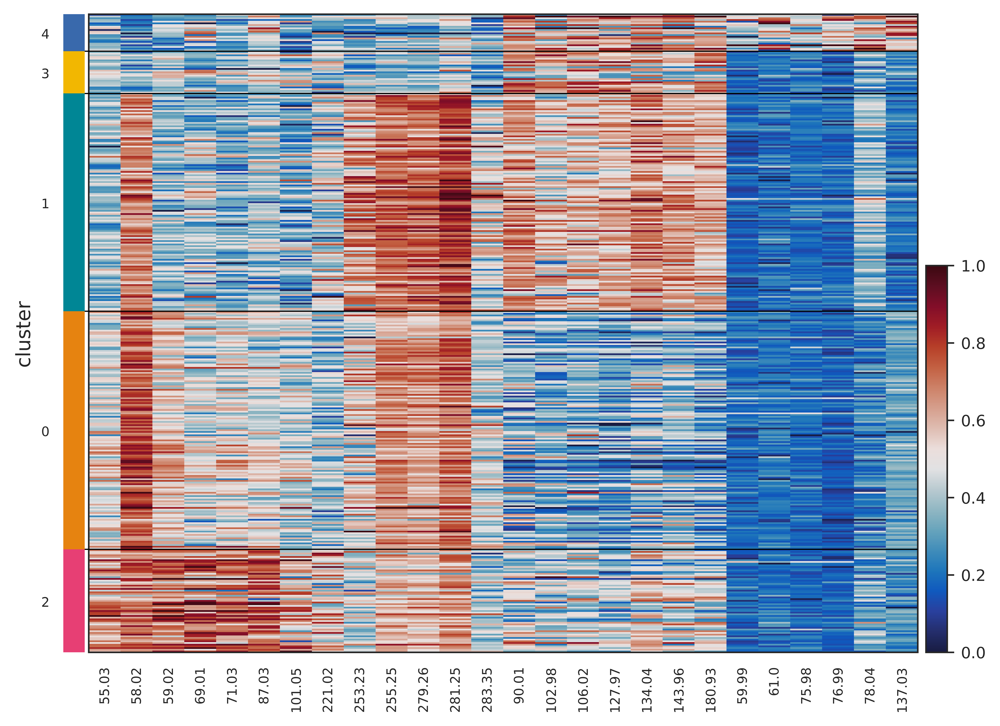

GridSpec(2, 4, height_ratios=[0, 6], width_ratios=[0.2, 7.8, 0, 0.2])

In [51]:

sc.pl.heatmap(a, markers,groupby='cluster',standard_scale='var', cmap=heatmap_cmp,dendrogram=False,save=None)


### spatial single cell map colored by SIMLR

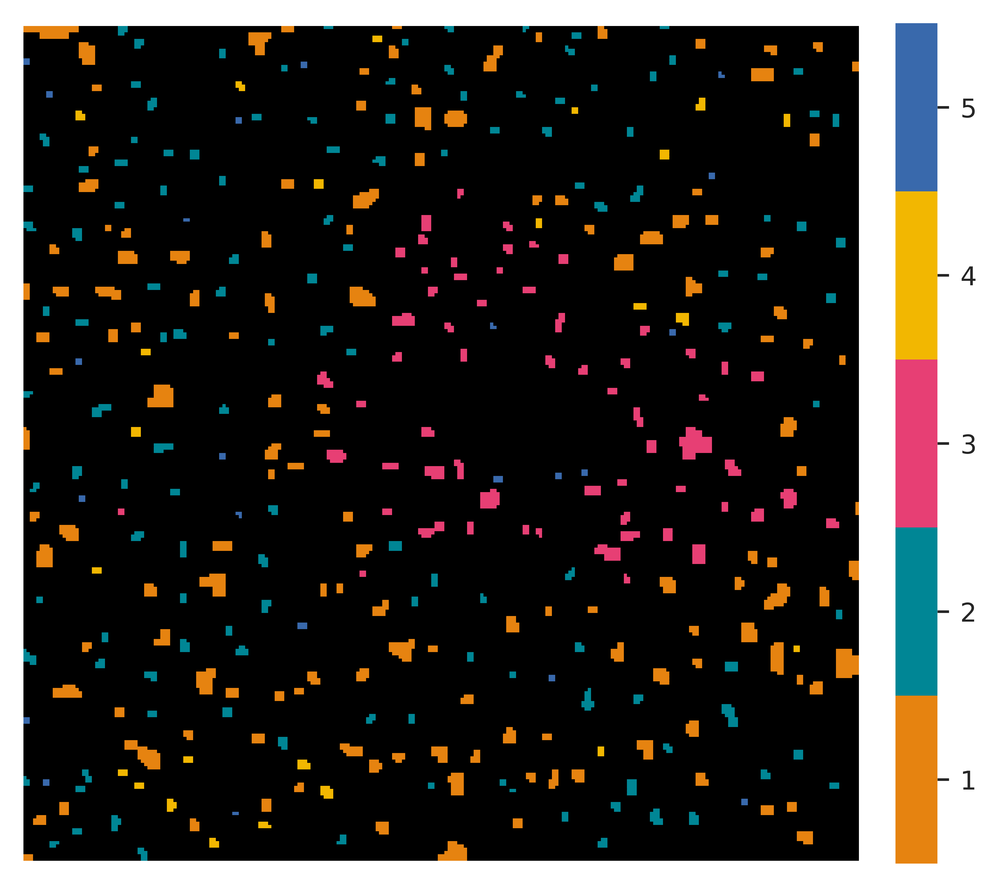

In [53]:
a.uns['cluster_colors'] = [cls_cmp[6],cls_cmp[7],cls_cmp[4],cls_cmp[3],cls_cmp[2]]
SEAM.pl.Cluster(a,cls='cluster',groups=range(5),method='mask')

### spatial single cell map of particular clusters 

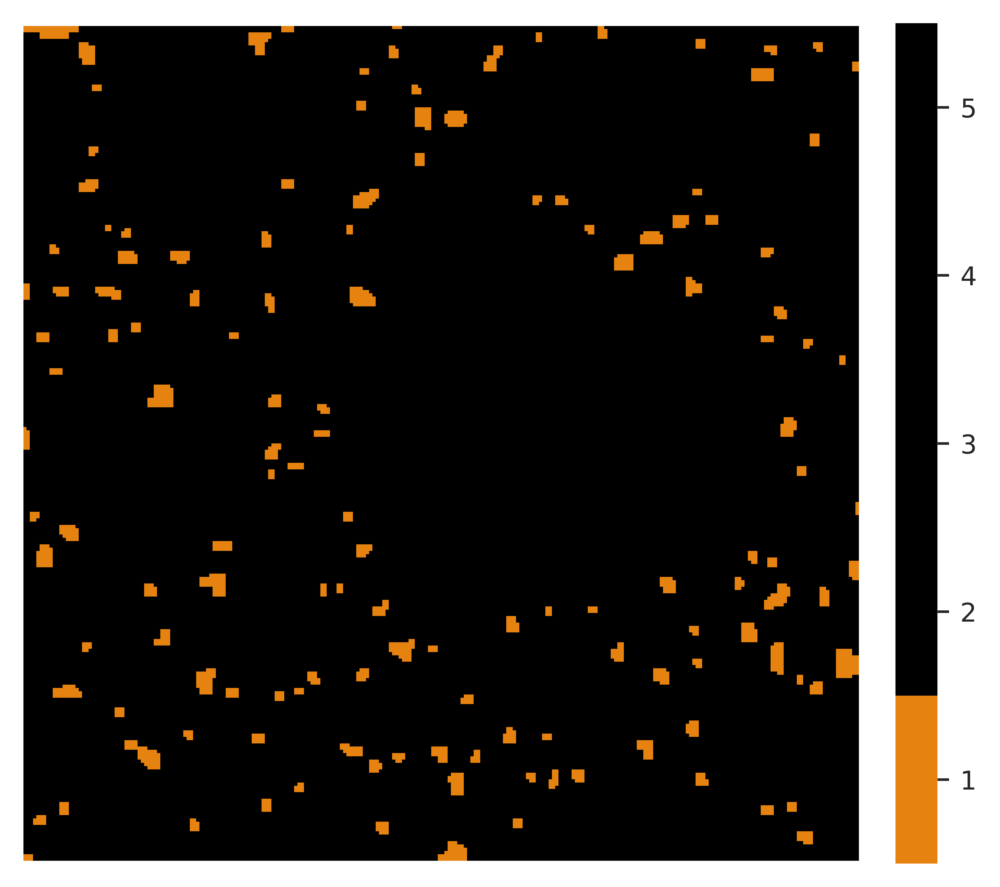

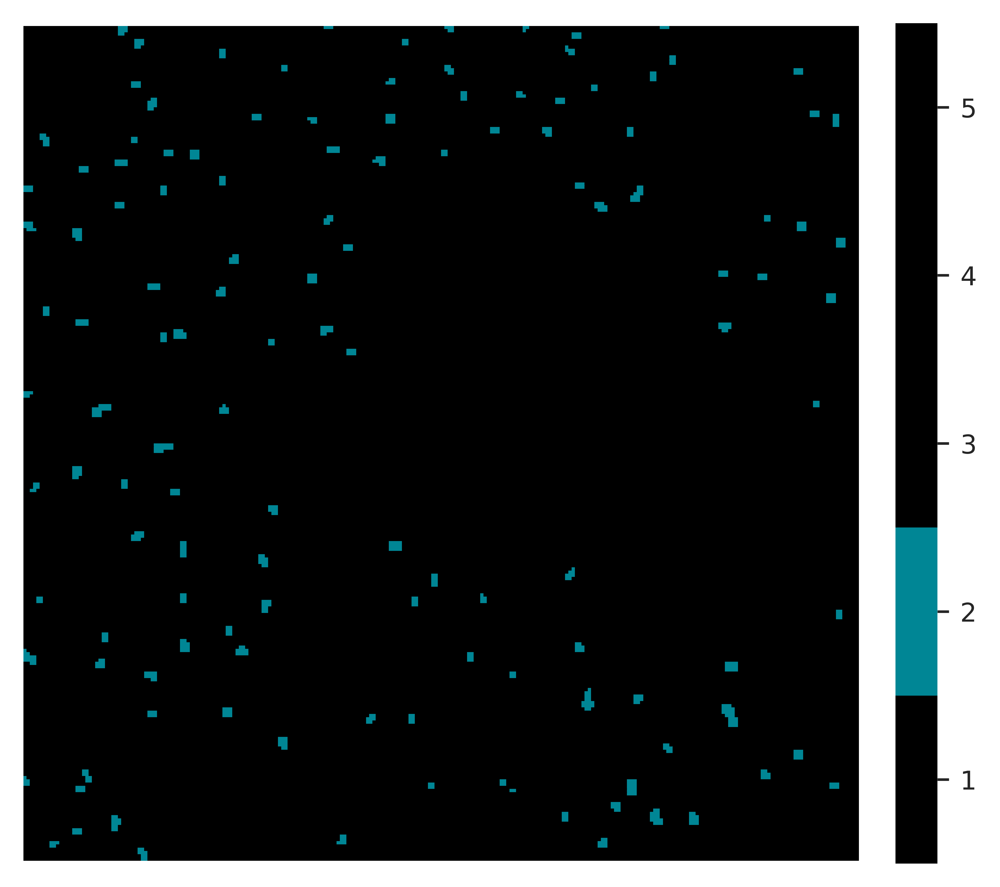

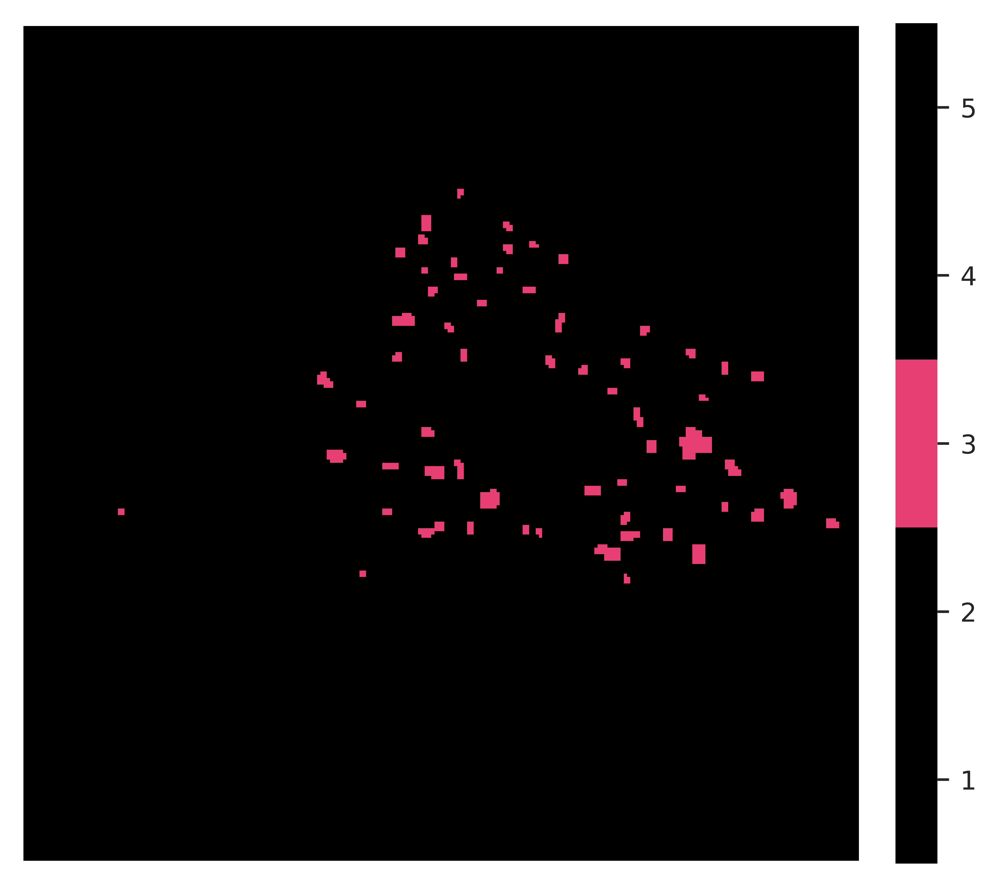

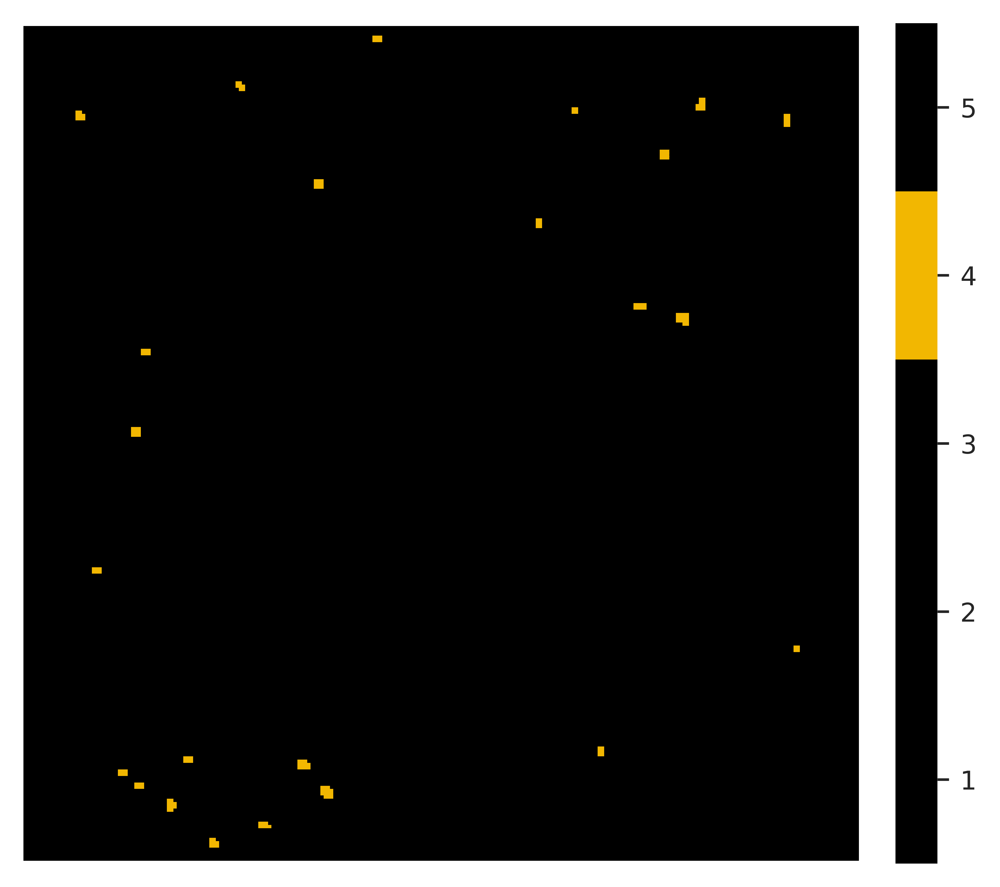

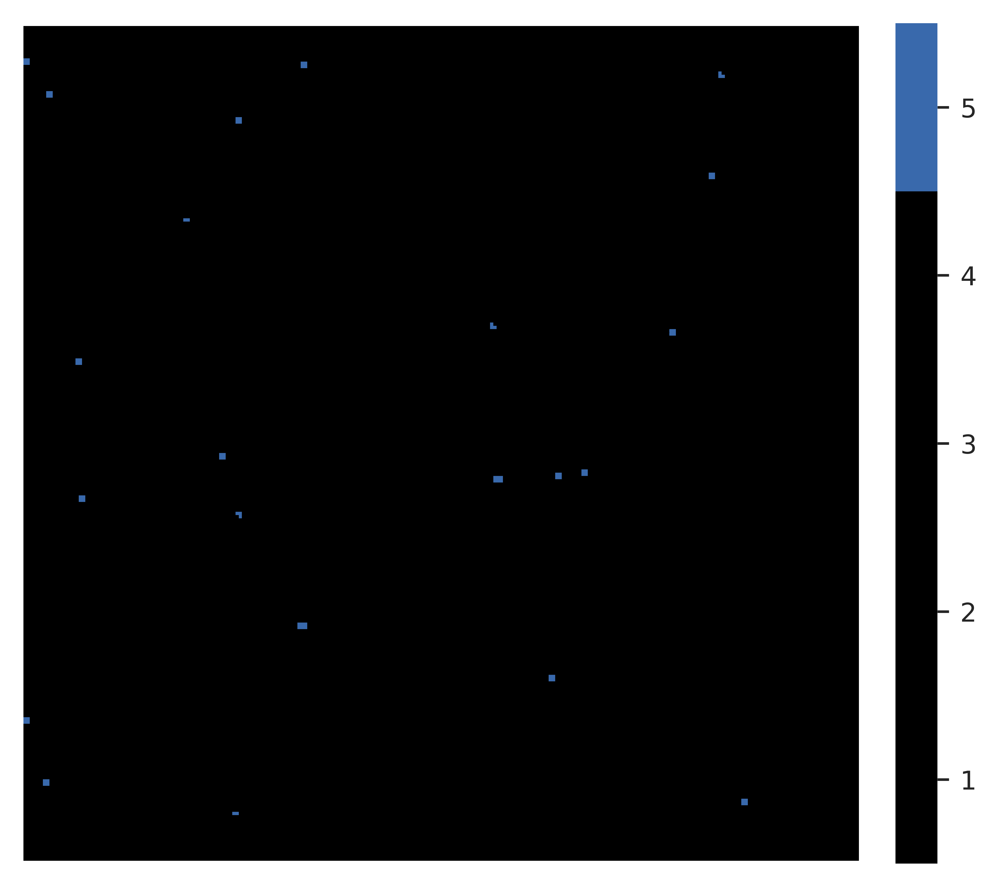

In [54]:
for i in range(5):
    SEAM.pl.Cluster(a,cls='cluster',groups=[i],method='mask')

# cross sample comparison

In [526]:
a_use1 = a.copy()


In [528]:
a_use1_var_names = np.array(a_use1.var_names)
aligned_var_names = []
for ms in a_use1_var_names:
    if float(ms)<100:
        aligned_var_names.append(float(ms)+0.3)
    elif float(ms)>=100 and float(ms)<200:
        aligned_var_names.append(float(ms)+0.4)
    else:
        aligned_var_names.append(float(ms)+0.5)

a_use1.var_names =  np.round(np.array(aligned_var_names),2).astype('str')
        

In [239]:
for i in a_use1.var_names:
    print(i)

50.31
50.86
51.32
51.87
52.32
52.88
53.32
53.88
54.34
55.33
56.34
57.32
58.32
59.32
60.29
61.3
62.31
63.27
63.88
64.31
65.31
66.31
67.33
68.33
69.31
70.35
71.33
72.32
73.33
74.32
75.3
76.28
77.29
78.34
79.26
80.2
81.29
82.33
83.34
84.34
85.35
86.32
87.33
88.32
89.31
90.31
91.3
92.32
93.34
94.33
95.32
96.31
97.3
98.33
99.35
100.44
101.45
102.37
103.38
104.41
105.41
106.42
107.42
108.44
109.44
110.42
111.44
112.4
113.47
114.44
115.46
116.45
117.42
118.44
119.42
120.42
121.42
122.42
123.42
124.44
125.46
126.44
127.47
128.37
129.45
130.44
131.43
132.43
133.46
134.44
135.43
136.42
137.43
138.43
139.45
140.45
141.48
142.43
143.39
144.36
145.39
146.39
147.42
148.42
149.4
150.44
151.44
152.43
153.48
154.46
155.5
156.47
157.44
158.37
159.36
160.39
161.4
162.4
163.43
164.38
165.34
166.44
167.46
168.45
169.51
170.48
171.43
172.43
173.42
174.43
175.43
176.39
177.39
178.4
179.45
181.33
183.39
185.42
186.43
187.4
188.43
189.44
190.43
191.43
192.41
193.46
195.52
199.34
201.5
203.51
205.46
208.49
209.

In [184]:
a_use2 = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/h5ad/mouse/liver/data.h5ad')

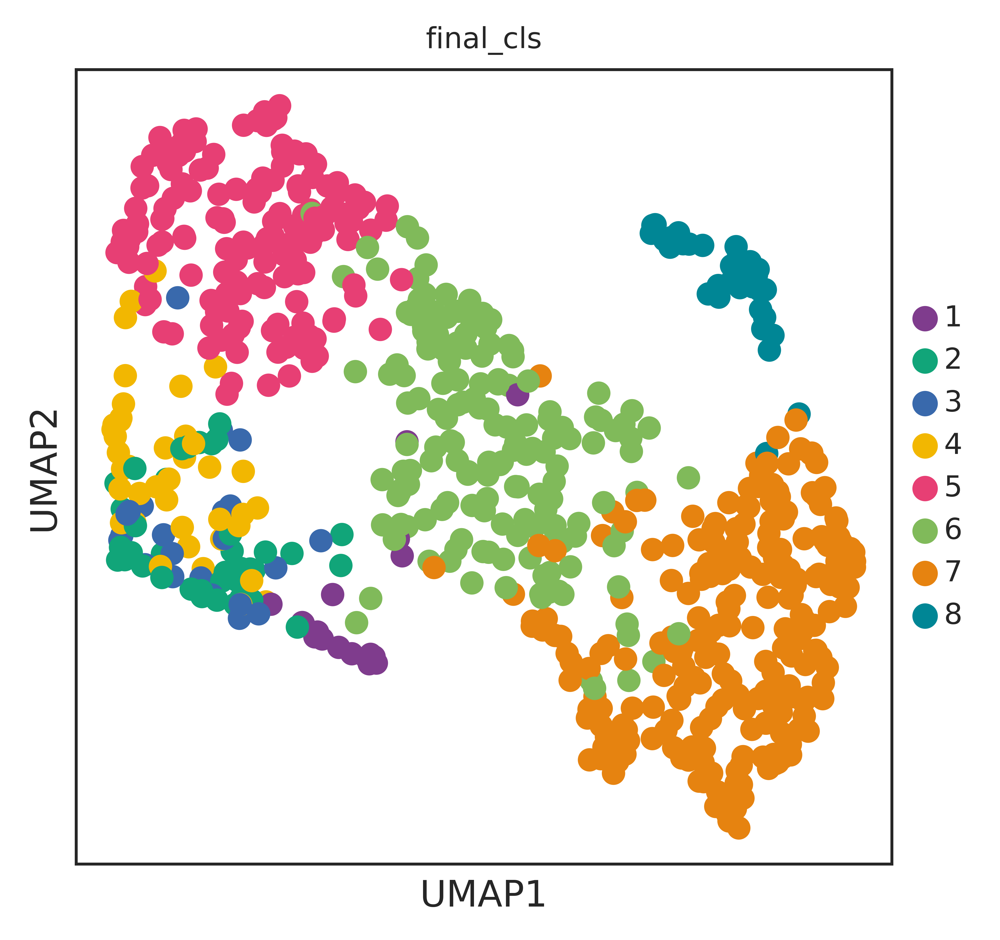

In [185]:
sc.pl.umap(a_use2,color='final_cls',palette=cls_cmp)

according to HE staining, (5,6,7,8) are hepatocytes; 4 is Kupffer cell; (2,3) are Endothelial cells

In [186]:
a_use2 = a_use2[a_use2.obs['final_cls']!='1']

In [187]:
a_liver_CT = {
    'Hepatocyte':['5','6','7'],
    'Kupffer':['4'],
    'Endotoelial':['2','3'],
    'Hepatocyte_CV':['8']
}

In [188]:
CT_num = np.array(a_use2.obs['final_cls'].copy())
for ct in a_liver_CT.keys():
    
    CT_num[np.isin(CT_num,a_liver_CT[ct])]=ct

In [189]:
a_use2.obs['CT'] = CT_num

Trying to set attribute `.obs` of view, copying.


... storing 'CT' as categorical


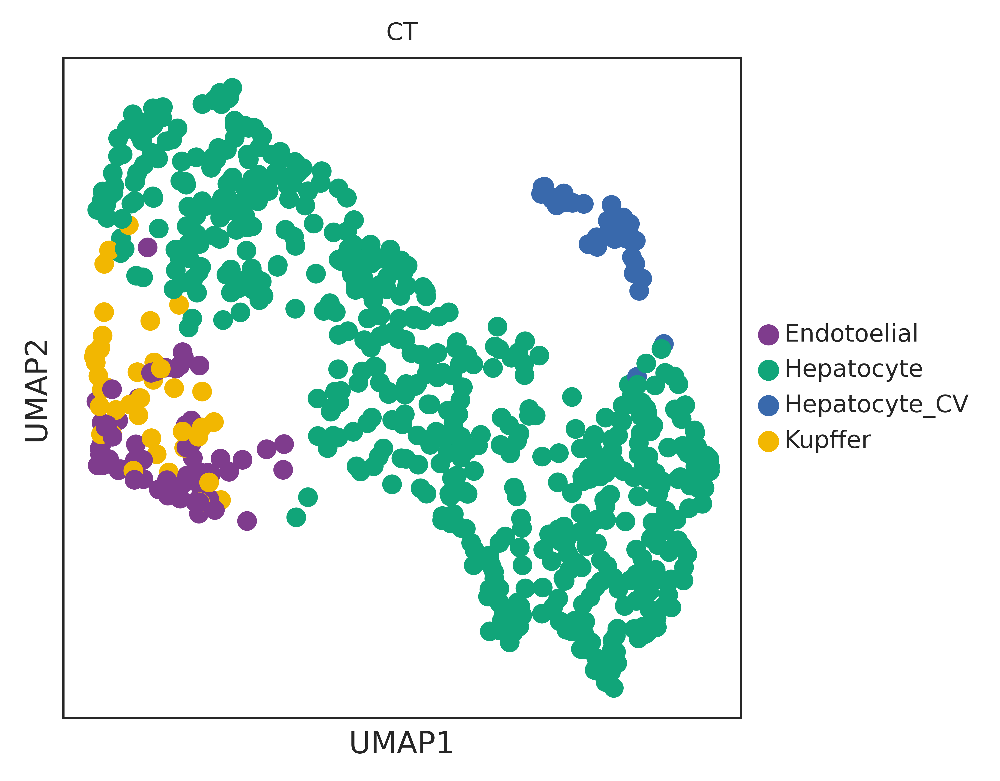

In [190]:
sc.pl.umap(a_use2,color='CT',palette=cls_cmp)

get markers for every cell type

In [248]:
a_use1.uns['rank_genes_groups']

{'params': {'groupby': 'CT',
  'reference': 'rest',
  'method': 't-test_overestim_var',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'scores': rec.array([( 8.28443527e+00,  16.545855  , 11.782787  ,  3.3764110e+00),
            ( 7.98354673e+00,  16.535435  , 11.471037  ,  2.9156156e+00),
            ( 6.81209898e+00,  16.50463   , 10.744443  ,  2.6217546e+00),
            ( 6.65387344e+00,  14.915636  , 10.290836  ,  2.5189676e+00),
            ( 6.49229288e+00,  10.36091   ,  9.838252  ,  2.4724255e+00),
            ( 6.20971870e+00,   4.177893  ,  9.691346  ,  2.4623296e+00),
            ( 6.05135870e+00,   4.1164985 ,  7.1139216 ,  1.9350002e+00),
            ( 4.96635485e+00,   3.4794958 ,  5.70211   ,  1.8022590e+00),
            ( 4.56213903e+00,   3.4760952 ,  3.0660954 ,  1.7709545e+00),
            ( 4.35693359e+00,   3.351187  ,  2.854883  ,  1.7644095e+00),
            ( 4.12575722e+00,   3.2818143 ,  1.9185702 ,  1.4607677e+00),
            

In [296]:
a_use2.obs['CT']

index
0         Hepatocyte
1         Hepatocyte
2      Hepatocyte_CV
3         Hepatocyte
4         Hepatocyte
           ...      
719       Hepatocyte
720      Endotoelial
721       Hepatocyte
722       Hepatocyte
723       Hepatocyte
Name: CT, Length: 706, dtype: category
Categories (4, object): [Endotoelial, Hepatocyte, Hepatocyte_CV, Kupffer]

In [538]:
sc.tl.rank_genes_groups(a_use1,n_genes=a_use1.shape[0],groupby='CT')
a_use1_markers = get_m_from_p(a_use1,9,method='score_topk')
# a_use1_markers = get_m_from_p(a_use1,0.000001)


sc.tl.rank_genes_groups(a_use2,n_genes=a_use2.shape[0],groupby='CT')
a_use2_markers = get_m_from_p(a_use2,9,method='score_topk')
# a_use2_markers = get_m_from_p(a_use2,10,method='pval_topk')

# a_use2_markers = get_m_from_p(a_use2,0.000001)




ranking genes
    finished (0:00:00)
10
10
10
10
ranking genes
    finished (0:00:00)
10
10
10
10


In [539]:
a_use1_markers

[array(['137.43', '77.29', '76.28', '119.42', '61.3', '78.34', '60.29',
        '179.45', '219.45', '136.42'], dtype='<U6'),
 array(['255.75', '279.76', '281.75', '253.73', '58.32', '111.44',
        '113.47', '99.35', '70.35', '283.85'], dtype='<U6'),
 array(['87.33', '71.33', '69.31', '59.32', '55.33', '101.45', '221.52',
        '57.32', '97.3', '70.35'], dtype='<U6'),
 array(['79.26', '63.27', '65.31', '66.31', '64.31', '106.42', '165.34',
        '103.38', '133.46', '181.33'], dtype='<U6')]

In [541]:
a_use2_markers

[array(['77.31', '76.29', '60.26', '61.28', '63.27', '117.42', '181.42',
        '134.48', '78.32', '165.41'], dtype='<U6'),
 array(['255.83', '70.35', '58.3', '279.85', '111.43', '281.87', '99.41',
        '113.46', '73.35', '82.37'], dtype='<U6'),
 array(['87.36', '69.32', '71.34', '101.41', '59.31', '221.56', '57.29',
        '99.41', '73.35', '58.3'], dtype='<U6'),
 array(['63.27', '181.42', '79.29', '90.36', '134.48', '165.41', '64.31',
        '117.42', '128.39', '78.32'], dtype='<U6')]

In [542]:
a_use1_meta_list = np.round(np.array(a_use1.var_names).astype('float'))
a_use2_meta_list = np.round(np.array(a_use2.var_names).astype('float'))
bg_meta_list = np.hstack([a_use1_meta_list,a_use2_meta_list])
bg_meta_list = np.unique(bg_meta_list)

In [543]:
bg_meta_list.shape

(281,)

In [544]:
# R1_hepa_list = cat,5]
# m_hepa_list = [2,3,4,5]

# a_use1_cls = ['fibro','endo','kupf','im','69-','69+']
# a_use2_cls = ['fibro','endo','kupf','im','69-','69+']

a_use1_cls = np.array(a_use1.obs['CT'].cat.categories)
a_use2_cls = np.array(a_use2.obs['CT'].cat.categories)
pd_dict = {
    'use1':[],
    'use2':[],
    'pval':[]
}
MIA_map = np.zeros(shape=(len(a_use1_markers),len(a_use2_markers)))
for i in range(len(a_use1_markers)):
    cur_use1 =  np.unique(np.round(a_use1_markers[i].astype('float')))
    for j in range(len(a_use2_markers)):
        cur_use2 = np.unique(np.round(a_use2_markers[j].astype('float')))
        cur_overlap = np.intersect1d(cur_use1,cur_use2).shape[0]
        cur_total = len(bg_meta_list)
        cur_list1 = max(cur_use1.shape[0],cur_use2.shape[0])
        cur_list2 = min(cur_use1.shape[0],cur_use2.shape[0])
        cur_p = scipy.stats.hypergeom.sf(cur_overlap-1,cur_total,cur_list1,cur_list2)
        cur_p_log = -np.log10(cur_p)
        
        print('liver 1:{0}, liver 2:{1}, {2}/{3}/{4}/{5}, pval:{6}'.format(a_use1_cls[i],a_use2_cls[j],cur_total,cur_list1,cur_list2,cur_overlap,cur_p_log))
        MIA_map[i,j] = cur_p_log
        pd_dict['use1'].append(a_use1_cls[i])
        pd_dict['use2'].append(a_use2_cls[j])
        pd_dict['pval'].append(cur_p_log)
        

liver 1:Endothelial, liver 2:Endotoelial, 281/10/10/5, pval:5.379221100778431
liver 1:Endothelial, liver 2:Hepatocyte, 281/10/10/0, pval:-0.0
liver 1:Endothelial, liver 2:Hepatocyte_CV, 281/10/10/0, pval:-0.0
liver 1:Endothelial, liver 2:Kupffer, 281/10/10/1, pval:0.5112174269810154
liver 1:Hepatocyte, liver 2:Endotoelial, 281/10/10/0, pval:-0.0
liver 1:Hepatocyte, liver 2:Hepatocyte, 281/10/10/8, pval:11.639723839614224
liver 1:Hepatocyte, liver 2:Hepatocyte_CV, 281/10/10/2, pval:1.3555110389296292
liver 1:Hepatocyte, liver 2:Kupffer, 281/10/10/0, pval:-0.0
liver 1:Hepatocyte_CV, liver 2:Endotoelial, 281/10/10/0, pval:-0.0
liver 1:Hepatocyte_CV, liver 2:Hepatocyte, 281/10/10/1, pval:0.5112174269810154
liver 1:Hepatocyte_CV, liver 2:Hepatocyte_CV, 281/10/10/7, pval:9.26002316741857
liver 1:Hepatocyte_CV, liver 2:Kupffer, 281/10/10/0, pval:-0.0
liver 1:Kupffer, liver 2:Endotoelial, 281/10/10/3, pval:2.4631914329254374
liver 1:Kupffer, liver 2:Hepatocyte, 281/10/10/0, pval:-0.0
liver 1:K

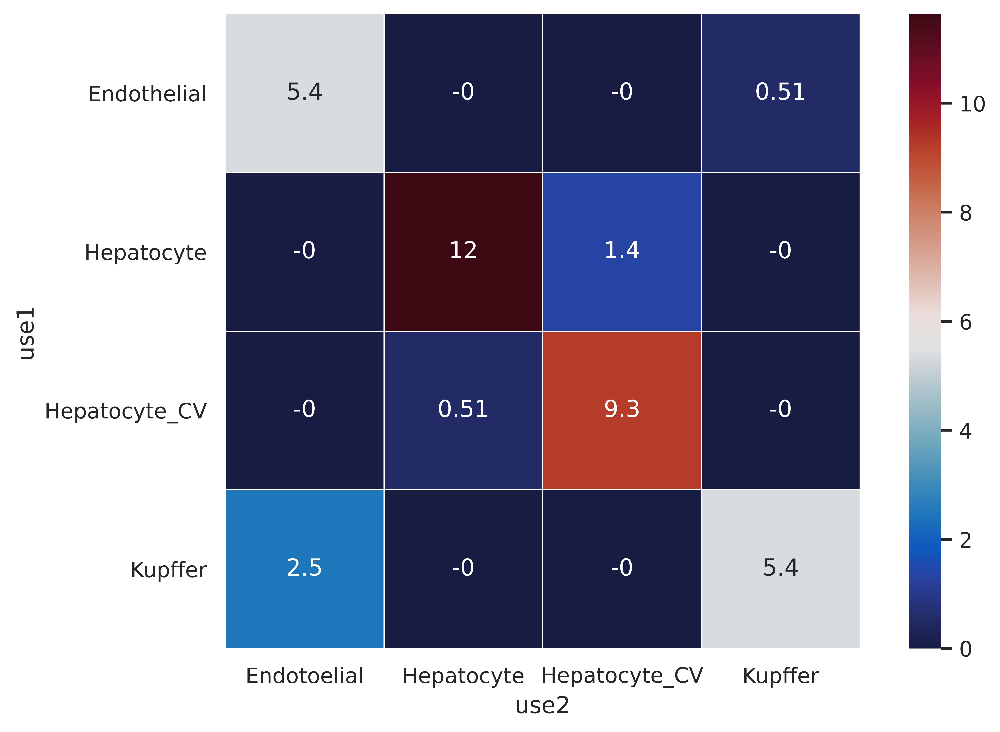

In [545]:
import matplotlib.pyplot as plt
import seaborn as sns
# save_file = 'figures/Fig2/MIA_map.png'
sns.set()
flights_long = pd.DataFrame(pd_dict)
# index='foo', columns='bar', values='baz'
flights = flights_long.pivot(index="use1", columns="use2", values="pval")

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(flights, annot=True,  linewidths=.5, ax=ax,cmap=heatmap_cmp,square=True)
# plt.savefig(save_file,transparent=True,format='png',bbox_inches='tight')


In [ ]:
SEAM.pl.IMS(a,list(a.var_names[:8]),n_cols=4)